In [1]:
%pylab inline

import gc
import os
import smatch
import treecorr

import detect3D
from pixel3D import cartesianGrid3D
from configparser import ConfigParser

import matplotlib
import matplotlib.pylab as plt

import astropy.io.ascii as ascii
import astropy.io.fits as pyfits
from astropy.table import Table,join,vstack
from cosmology import Cosmo

Default_OmegaM= 0.315
Default_h0  =   1.              # set to 1
cosmo   =   Cosmo(h=Default_h0,omega_m=Default_OmegaM)

Populating the interactive namespace from numpy and matplotlib


In [2]:
nz=10
pDict={'dempz': 'demp',\
       'dnnz': 'dnn',\
       'mizuki': 'mizuki'}
key='dempz'
colname=pDict[key]
glab='test'
fieldname='XMM'

#Dir
baseDir=  'wrkDir/test4/'
assert os.path.isdir(baseDir)
catDir=   baseDir
pzDir=os.path.join('datDir/catalog_tracts/','%s_tracts/' %fieldname)
assert os.path.isdir(pzDir)
fname=os.path.join(catDir,'src.fits')

outDir=   os.path.join(baseDir,'out')

In [3]:
lensDir=os.path.join(os.environ['homeWrk'],'lensCatalog/')
# CAMIRA
cclusters=ascii.read(os.path.join(lensDir,'CAMIRA/CAMIRA_S16A.csv'))
mask=(cclusters['z_cl']>0.)
cclusters=cclusters[mask]
czcl=cclusters['z_cl']
cycl=cclusters['coord_dec']
cxcl=cclusters['coord_ra']
    
# WHL
w0=ascii.read(os.path.join(lensDir,'WHL15/table3.dat'))
w1=ascii.read(os.path.join(lensDir,'WHL15/table4.dat'))
msk0=(w0['col5']>0.)
msk1=(w1['col5']>0.)
whlclusters=vstack(w0[msk0][['col3','col4','col5']],w1[msk1][['col3','col4','col5']])
wzcl=whlclusters['col5']
wycl=whlclusters['col4']
wxcl=whlclusters['col3']

# SDSS group
yclusters=ascii.read(os.path.join(lensDir,'SDSS_MAIN/Wang_sdss_hsc_s16a.csv'))
yzcl=yclusters['z_cl']
yycl=yclusters['coord_dec']
yxcl=yclusters['coord_ra']
    
# merge
# ra,dec,radius in degrees
raC  = np.hstack([cxcl,wxcl])#,yxcl])
decC = np.hstack([cycl,wycl])#,yycl])
zC   = np.hstack([czcl,wzcl])#,yzcl])
cc   = np.ones(len(zC)) # from which catalog?
cc[0:len(cxcl)]=0
cc[len(cxcl):len(cxcl)+len(wxcl)]=1
cc[len(cxcl)+len(wxcl):]=2

richness=np.ones(len(zC))*-1
richness[0:len(cxcl)]=cclusters['N_cor']

In [4]:
pozavname   =   os.path.join(catDir,'pozave-%s-%dbins.fits' %(key,nz))
assert os.path.isfile(pozavname)
poz_ave     =   pyfits.getdata(pozavname,ext=0)
zbounds     =   pyfits.getdata(pozavname,ext=1)['zbounds']
pbins       =   pyfits.getdata(os.path.join(pzDir,'8522_pz_pdf_%s.fits' %key),ext=2)['BINS']
configName  =   'wrkDir/config-obs-nl12-pc.ini'
assert os.path.isfile(configName)

parser      =   ConfigParser()
parser.read(configName)
parser.set('sourceZ','zbound','[%s]' %(','.join([str(bb) for bb in zbounds])))
gridInfo    =   cartesianGrid3D(parser)

# poz selection
data=pyfits.getdata(fname)
mask=(~np.isnan(data['%s_zbest' %colname]))\
    &(data['%s_zbest_std'%colname]<1.0)\
    &(data['%s_zbest'%colname]<3.0)\
    &(data['%s_zbest'%colname]>0.05)

data=data[mask]
# pixelization
x,y=gridInfo.setupTanPlane(data['ra'],data['dec'],pad=0.5)

In [5]:
outfname1=os.path.join(outDir,'alphaR-nng-alasso-lbd%02d.fits' %(1))
assert os.path.isfile(outfname1)

delta   =   pyfits.getdata(outfname1)
names   =   ('iz','iy','ix','value')
c1,v1   =   detect3D.local_maxima_3D(delta[:,0,:,:])
data1   =   np.hstack([c1,v1[:,None]])
src     =   Table(data=data1,names=names)

src['ra']=np.zeros(len(src))
src['dec']=np.zeros(len(src))
src['z']=np.zeros(len(src))
for ss in src:
    ss['ra']=gridInfo.xcgrid[int(ss['ix'])]
    ss['dec']=gridInfo.ycgrid[int(ss['iy'])]
    ss['z']=gridInfo.zlcgrid[int(ss['iz'])]

number of unique optical clusters matched:  80
number of unique lensing clusters matched:  40
number of lensing clusters total:  49
40


Text(0, 0.5, '$\\Delta z$')

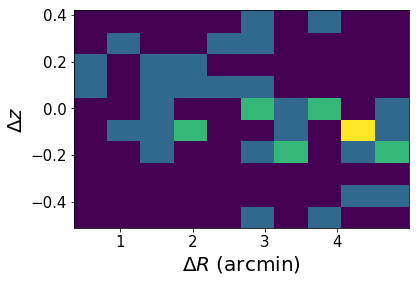

In [8]:
nside=2048    # healpix nside
maxmatch=3    # return n closest matches
radius=5./60. #? arcmin match

src['matched']=np.zeros(len(src)).astype(bool)
# match
matches0 = smatch.match(src['ra'],src['dec'],radius,raC,decC,
           nside=nside, maxmatch=maxmatch)
dz0=src[matches0['i1']]['z']-zC[matches0['i2']]
dr0=np.sqrt((src[matches0['i1']]['ra']-raC[matches0['i2']])**2.\
            +(src[matches0['i1']]['dec']-decC[matches0['i2']])**2.)
src['matched'][matches0['i1']]=True

print('number of unique optical clusters matched: ',len(np.unique(matches0['i2'])))
print('number of unique lensing clusters matched: ',len(np.unique(matches0['i1'])))
print('number of lensing clusters total: ',len(src))
ind=np.lexsort((np.abs(dz0),-src['value'][matches0['i1']]))
ind2=np.unique(matches0['i1'][ind],return_index=True)[1]
ind3=ind[ind2]
matches1=matches0[ind3]
print(len(np.unique(matches1['i2'])))
dz=dz0[ind3]
dr=dr0[ind3]
zcl=zC[ind3]

src['dr']=np.zeros(len(src))
src['dz']=np.zeros(len(src))
src['zop']=np.zeros(len(src))
src['dr'][matches1['i1']]=dr
src['dz'][matches1['i1']]=dz
src['zop'][matches1['i1']]=zcl

#src['richness'][matches1['i1']]=richness[matches1['i2']]

plt.hist2d(dr*60.,dz)
plt.xlabel(r'$\Delta R$ (arcmin)',fontsize=20)
plt.ylabel(r'$\Delta z$',fontsize=20)
#plt.savefig('dzdr.png')
#print(cc[matches0['i2'][ind]])
#print(src['value'][matches0['i1'][ind]])

In [9]:
weight=np.sqrt(np.sum(gridInfo.lensing_kernel()**2.,axis=0))

In [10]:
weight

array([0.00673921, 0.01007613, 0.01264837, 0.01455482, 0.01580828,
       0.0165246 , 0.01683715, 0.0167898 , 0.01648738, 0.01597197,
       0.01532383, 0.01457687])

In [11]:
srcXX=src[~src['matched']]
srcYY=src[src['matched']]
print(len(srcXX)/len(src))
srcXX

0.1836734693877551


iz,iy,ix,value,ra,dec,z,matched,dr,dz,zop
float64,float64,float64,float64,float64,float64,float64,bool,float64,float64,float64
0.0,60.0,63.0,1.4287969823601292,32.566571694872536,-4.535237885244667,0.09,False,0.0,0.0,0.0
0.0,114.0,81.0,1.404117674848251,33.16657169487256,-2.7352378852446737,0.09,False,0.0,0.0,0.0
5.0,17.0,104.0,2.243142112781874,33.93323836153927,-5.9685712185779956,0.39,False,0.0,0.0,0.0
7.0,54.0,106.0,3.1045737029258436,33.99990502820593,-4.735237885244667,0.51,False,0.0,0.0,0.0
8.0,125.0,100.0,3.1237921561809054,33.79990502820593,-2.3685712185780083,0.5700000000000001,False,0.0,0.0,0.0
8.0,128.0,29.0,2.637355942505938,31.43323836153914,-2.2685712185780087,0.5700000000000001,False,0.0,0.0,0.0
9.0,21.0,92.0,3.6540527498640794,33.53323836153925,-5.835237885244663,0.63,False,0.0,0.0,0.0
9.0,84.0,55.0,3.5504896463370383,32.299905028205856,-3.73523788524467,0.63,False,0.0,0.0,0.0
9.0,88.0,118.0,3.4170669629510173,34.39990502820595,-3.6019045519113373,0.63,False,0.0,0.0,0.0


In [14]:
srcYY

iz,iy,ix,value,ra,dec,z,matched,dr,dz,zop
float64,float64,float64,float64,float64,float64,float64,bool,float64,float64,float64
0.0,26.0,124.0,1.625618548260491,34.59990502820597,-5.668571218577997,0.09,True,0.05548462270704781,-0.17400000000000002,0.8542
0.0,64.0,109.0,1.3126243838152083,34.09990502820594,-4.4019045519113345,0.09,True,0.07108398744422462,-0.34550000000000003,1.08
0.0,88.0,113.0,1.3684840547693218,34.23323836153928,-3.6019045519113373,0.09,True,0.06921836297714634,-0.12179999999999999,0.63
0.0,95.0,69.0,1.4572892034148621,32.76657169487254,-3.368571218578005,0.09,True,0.05842358654880346,-0.1474,0.1341
0.0,99.0,54.0,2.413190804309994,32.26657169487251,-3.235237885244672,0.09,True,0.060800452597369825,-0.0003000000000000086,0.6719
0.0,102.0,62.0,2.502805233426717,32.53323836153919,-3.1352378852446723,0.09,True,0.049862750940119986,-0.1571,0.8523
0.0,106.0,85.0,1.6347999084523939,33.2999050282059,-3.0019045519113394,0.09,True,0.017204181903212965,-0.056499999999999995,1.004
1.0,122.0,113.0,1.9469551949339008,34.23323836153928,-2.468571218578008,0.15,True,0.022916463345857726,-0.20199999999999999,0.1634
2.0,109.0,91.0,1.9458732766028537,33.499905028205916,-2.90190455191134,0.21,True,0.055396956341035704,-0.05679999999999999,0.7339


0.8208569785208771 0.0


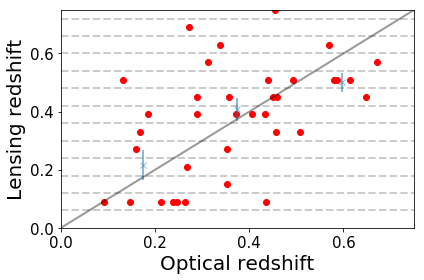

In [18]:
plt.close()
cm = plt.cm.get_cmap('brg')
norm=matplotlib.colors.SymLogNorm(vmin=1.,vmax=7,linthresh=0.01)
A = np.vstack([zC[matches1['i2']], np.zeros(len(matches1))]).T
m, c = np.linalg.lstsq(A,src[matches1['i1']]['z'],rcond=None)[0]
print(m,c)
x=[];y=[];yerr=[]
mask=(zC[matches1['i2']]<0.25)
x.append(np.average(zC[matches1['i2']][mask]))
y.append(np.average(src[matches1['i1']]['z'][mask]))
yerr.append(np.std(src[matches1['i1']]['z'][mask])/np.sqrt(np.sum(mask)))

mask=(zC[matches1['i2']]>=0.25)&(zC[matches1['i2']]<0.5)
x.append(np.average(zC[matches1['i2']][mask]))
y.append(np.average(src[matches1['i1']]['z'][mask]))
yerr.append(np.std(src[matches1['i1']]['z'][mask])/np.sqrt(np.sum(mask)))

mask=((zC[matches1['i2']]>=0.5)&(zC[matches1['i2']]<0.75))
x.append(np.average(zC[matches1['i2']][mask]))
y.append(np.average(src[matches1['i1']]['z'][mask]))
yerr.append(np.std(src[matches1['i1']]['z'][mask])/np.sqrt(np.sum(mask)))
plt.errorbar(x,y,yerr,fmt='x',alpha=0.5)
im=plt.scatter(zC[matches1['i2']],src[matches1['i1']]['z'],c='red'\
              )#,c=src[matches1['i1']]['value'],norm=norm,cmap=cm)
plt.plot(np.linspace(0,1.2,10),np.linspace(0,1.2,10),c='black',ls='-',alpha=0.4)
for izb in gridInfo.zlbound:
    plt.plot(np.linspace(0,1.2,10),izb*np.ones(10),c='black',ls='--',alpha=0.2)
plt.xlabel('Optical redshift',fontsize=20)
plt.ylabel('Lensing redshift',fontsize=20)
plt.xlim(0.,0.75)
plt.ylim(0.,0.75)
#cb=plt.colorbar()
#cb.ax.set_title(r'$\hat{M}_{200} [10^{14}{\rm h}^{-1}M_\odot]$',fontsize=15)
#cb.set_ticks(())
#cb.set_ticks((1,3,5,7))
#cb.set_ticklabels(['1','3','5','7'])
plt.tight_layout()

9
40


Text(0, 0.5, '$\\langle \\gamma_t \\rangle$')

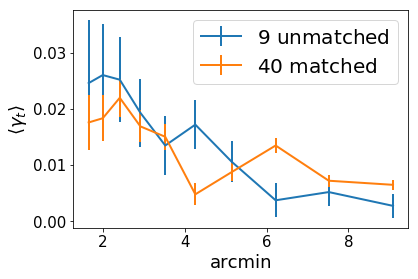

In [80]:
plt.close()
labels=['$9$ unmatched','$40$ matched']
for iu,srcU in enumerate([srcXX,srcYY]):
    print(len(srcU))
    mskU=(data['demp_zbest']>np.average(srcU['z'])+0.4)

    dataU=data[mskU]
    catH   =   treecorr.Catalog(ra=srcU['ra'],dec=srcU['dec'], ra_units='deg',dec_units='deg')
    catE   =   treecorr.Catalog(g1=dataU['g1'],g2=-dataU['g2'],ra=dataU['ra'],dec=dataU['dec'],ra_units='deg',dec_units='deg')
    #Do the correlation
    corE     =   treecorr.NGCorrelation(nbins=10,min_sep=1.5,max_sep=10.,sep_units='arcmin')
    corE.process(catH,catE)
    plt.errorbar(corE.rnom,corE.xi,np.sqrt(corE.varxi/2.),label=labels[iu])
plt.legend()
plt.xlabel('arcmin')
plt.ylabel(r'$\langle \gamma_t \rangle$')

Text(0, 0.5, 'Num')

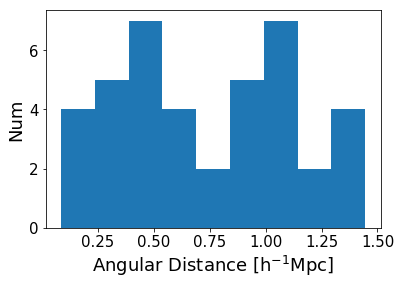

In [13]:
plt.close()
plt.hist(cosmo.Da(0,srcYY['zop'])*srcYY['dr']/180.*np.pi,bins=9)
plt.xlabel(r'Angular Distance [h$^{-1}$Mpc]')
plt.ylabel('Num')